# Cost Benefit Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.neighbors import KernelDensity
from datetime import date, timedelta
from math import sin, cos, sqrt, atan2, radians

%matplotlib inline
plt.style.use('seaborn')
#pandas options
pd.set_option('display.max_columns', 500)

## Load Spray Data

In [2]:
spray = pd.read_csv('../data/spray.csv')

In [3]:
spray.head()

,Date,Time,Latitude,Longitude
0,2011-08-29,6:56:58 PM,42.391623,-88.089163
1,2011-08-29,6:57:08 PM,42.391348,-88.089163
2,2011-08-29,6:57:18 PM,42.391022,-88.089157
3,2011-08-29,6:57:28 PM,42.390637,-88.089158
4,2011-08-29,6:57:38 PM,42.390410,-88.088858


In [4]:
spray.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14835 entries, 0 to 14834
Data columns (total 4 columns):
Date         14835 non-null object
Time         14251 non-null object
Latitude     14835 non-null float64
Longitude    14835 non-null float64
dtypes: float64(2), object(2)
memory usage: 463.7+ KB


In [5]:
spray.shape

(14835, 4)

There are 14,835 rows and 5 columns in the Spray dataset.

In [6]:
#Convert to datetime format
spray['Date'] = pd.to_datetime(spray['Date'])
spray['Time'] = pd.to_datetime(spray['Time'])

In [7]:
spray.sort_values(by=['Date', 'Time'])

,Date,Time,Latitude,Longitude
0,2011-08-29,2020-02-13 18:56:58,42.391623,-88.089163
1,2011-08-29,2020-02-13 18:57:08,42.391348,-88.089163
2,2011-08-29,2020-02-13 18:57:18,42.391022,-88.089157
3,2011-08-29,2020-02-13 18:57:28,42.390637,-88.089158
4,2011-08-29,2020-02-13 18:57:38,42.390410,-88.088858
...,...,...,...,...
14601,2013-09-05,2020-02-13 20:40:16,42.001388,-87.811297
14602,2013-09-05,2020-02-13 20:40:26,42.000962,-87.811843
14603,2013-09-05,2020-02-13 20:40:36,42.000553,-87.812330
14604,2013-09-05,2020-02-13 20:40:46,42.000955,-87.813083


In [8]:
spray_agg = spray.groupby('Date').count()['Latitude'].to_frame()

In [9]:
spray_agg.columns = ['spray_locations']
spray_agg.sort_index()

,spray_locations
Date,
2011-08-29,95
2011-09-07,2114
2013-07-17,2202
2013-07-25,1607
2013-08-08,1195
2013-08-15,2668
2013-08-16,141
2013-08-22,1587
2013-08-29,2302


In [10]:
spray_agg.index

DatetimeIndex(['2011-08-29', '2011-09-07', '2013-07-17', '2013-07-25',
               '2013-08-08', '2013-08-15', '2013-08-16', '2013-08-22',
               '2013-08-29', '2013-09-05'],
              dtype='datetime64[ns]', name='Date', freq=None)

After aggregation, there are 10 dates in which spraying was conducted in our Spray Dataset. 2 of the dates correspond to 2011 and 8 of the dates correspond to 2013.

In [11]:
train =pd.read_csv('../data/weather_train_merged.csv') 

In [12]:
train.head()

,Date,Trap,Latitude,Longitude,WnvPresent,year_month,NumMosquitos,station,carrier,jul,jun,may,oct,sep,species_pipiens,species_pipiens/restuans,species_restuans,species_salinarius,species_tarsalis,species_territans,species_unspecified_culex,Station,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed,year_y,day,month,drizzle,smoke,storm,snow,mist,rain,h_fog,fog,haze,week_y,tavg_lag_1,tavg_lag_3,tavg_lag_7,preciptotal_lag_1,preciptotal_lag_3,preciptotal_lag_7,sunrise_clean,sunset_clean,DaylightHrs,DaylightHrs_lag_1,DaylightHrs_lag_3,DaylightHrs_lag_7,relhum,relhum_lag_1,relhum_lag_3,relhum_lag_7
0,2007-05-29,T002,41.954690,-87.800991,0,"(2007, 5)",1,1,1,0,0,1,0,0,0,1,0,0,0,0,0.0,1,88,60,74,58,65,0,9,421,1917,0.0,0.0,29.39,30.11,5.8,18,6.5,2007,29,May,0,0,0,0,1,0,0,0,1,22,65.0,67.0,62.0,0.0,0.08,0.09,1900-01-01 04:21:00,1900-01-01 19:17:00,14,14.0,14.0,14.0,57.442779,56.178168,52.418054,55.746196
1,2007-05-29,T002,41.954690,-87.800991,0,"(2007, 5)",1,1,1,0,0,1,0,0,0,0,1,0,0,0,0.0,1,88,60,74,58,65,0,9,421,1917,0.0,0.0,29.39,30.11,5.8,18,6.5,2007,29,May,0,0,0,0,1,0,0,0,1,22,65.0,67.0,62.0,0.0,0.08,0.09,1900-01-01 04:21:00,1900-01-01 19:17:00,14,14.0,14.0,14.0,57.442779,56.178168,52.418054,55.746196
2,2007-05-29,T007,41.994991,-87.769279,0,"(2007, 5)",1,1,1,0,0,1,0,0,0,0,1,0,0,0,0.0,1,88,60,74,58,65,0,9,421,1917,0.0,0.0,29.39,30.11,5.8,18,6.5,2007,29,May,0,0,0,0,1,0,0,0,1,22,65.0,67.0,62.0,0.0,0.08,0.09,1900-01-01 04:21:00,1900-01-01 19:17:00,14,14.0,14.0,14.0,57.442779,56.178168,52.418054,55.746196
3,2007-05-29,T143,41.999129,-87.795585,0,"(2007, 5)",1,1,1,0,0,1,0,0,0,1,0,0,0,0,0.0,1,88,60,74,58,65,0,9,421,1917,0.0,0.0,29.39,30.11,5.8,18,6.5,2007,29,May,0,0,0,0,1,0,0,0,1,22,65.0,67.0,62.0,0.0,0.08,0.09,1900-01-01 04:21:00,1900-01-01 19:17:00,14,14.0,14.0,14.0,57.442779,56.178168,52.418054,55.746196
4,2007-05-29,T148,42.017430,-87.687769,0,"(2007, 5)",1,1,1,0,0,1,0,0,0,1,0,0,0,0,0.0,1,88,60,74,58,65,0,9,421,1917,0.0,0.0,29.39,30.11,5.8,18,6.5,2007,29,May,0,0,0,0,1,0,0,0,1,22,65.0,67.0,62.0,0.0,0.08,0.09,1900-01-01 04:21:00,1900-01-01 19:17:00,14,14.0,14.0,14.0,57.442779,56.178168,52.418054,55.746196


In [13]:
train['Date'] =  pd.to_datetime(train['Date'])

## Further Research - Deployment of Spray

### Aerial Spraying - An effective tool for killing mosquitoes
Aerial treatment of areas with products that rapidly reduce both adult mosquitoes and their larvae that may carry viruses can be effective. Repeated aerial applications of insecticide has reduced mosquito populations as a part of an integrated mosquito management program.

### Spray Type - Naled
- Naled has been extensively used since the 1950s and is currently applied by aerial and ground spraying to an average of approximately 16 million acres of the continental United States annually.
- It is also used for mosquito control following natural disasters, such as hurricanes and floods. (Human Exposure to Mosquito-Control Pesticides ― Mississippi, North Carolina, and Virginia, 2002 and 2003, CDC, 2005)
- In 2004 and 2005, it was used as part of the emergency responses to Hurricanes Charley, Jeanne, Frances, and Katrina.
- Naled is currently used in the United States by many local governments and mosquito control districts, including the Florida Keys Mosquito Control District, the Lee County Mosquito Control District, and Miami-Dade County.
- Historically, Naled has been used in Puerto Rico in attempts to control dengue.

### Charateristics & Effects of Naled
- Naled starts to degrade (break down) immediately on surfaces, in water, and in sunlight.
- The chemical dichlorvos (DDVP) can be created when Naled degrades. It also breaks down quickly.
- In small quantities DDVP has not been shown to cause health problems in people.
- DDVP does not build up in breast milk or breast tissue.

## Effectiveness of Spray on Mosquitoes

In [14]:
from math import radians, cos, sin, asin, sqrt

def haversine(lat1, lon1, lat2, lon2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371 # Radius of earth in kilometers. Use 3956 for miles
    
    #distance in km
    distance = r * c
    
    return round(distance,4)

In [15]:
df_spray_final = pd.DataFrame(columns=['last_spray_date', 'spray_lat', 'spray_lng', 'tr_date', 'tr_lat', 'tr_lng' , 'num_mosquitos'])

In [16]:
for i in range(spray.shape[0]): #loop thru spray date
        spray_date = spray.loc[i, 'Date']
        spray_lat = spray.loc[i, 'Latitude']
        spray_lon = spray.loc[i, 'Longitude']
        
        tr_coincide = train[(train['Date'] > spray_date)].reset_index()
        for j in range(tr_coincide.shape[0]): #loop thru train 
            tr_date = tr_coincide.loc[j, 'Date']
            tr_lat = tr_coincide.loc[j, 'Latitude']
            tr_lon = tr_coincide.loc[j, 'Longitude']
            num_mosquito = tr_coincide.loc[j, 'NumMosquitos']
            if haversine(tr_lat, tr_lon, spray_lat, spray_lon) < 0.2:
                df_spray_final = df_spray_final.append({'last_spray_date': spray_date,
                                      'spray_lat': spray_lat,
                                      'spray_lng': spray_lon,
                                      'tr_date':  tr_date,
                                      'tr_lat': tr_lat,
                                      'tr_lng': tr_lon,
                                      'num_mosquitos': num_mosquito}, ignore_index=True)

In [17]:
df_spray_final = df_spray_final[(df_spray_final['tr_date'] > df_spray_final['last_spray_date'])]

In [18]:
df_spray_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3064 entries, 0 to 3063
Data columns (total 7 columns):
last_spray_date    3064 non-null datetime64[ns]
spray_lat          3064 non-null float64
spray_lng          3064 non-null float64
tr_date            3064 non-null datetime64[ns]
tr_lat             3064 non-null float64
tr_lng             3064 non-null float64
num_mosquitos      3064 non-null object
dtypes: datetime64[ns](2), float64(4), object(1)
memory usage: 191.5+ KB


In [19]:
df_spray_final['num_mosquitos'] = df_spray_final['num_mosquitos'].astype(int)

In [20]:
df_spray_final.head()

,last_spray_date,spray_lat,spray_lng,tr_date,tr_lat,tr_lng,num_mosquitos
0,2011-09-07,41.975137,-87.804762,2011-09-12,41.973845,-87.805059,8
1,2011-09-07,41.975137,-87.804762,2011-09-12,41.973845,-87.805059,2
2,2011-09-07,41.975137,-87.804762,2011-09-16,41.973845,-87.805059,9
3,2011-09-07,41.975137,-87.804762,2011-09-16,41.973845,-87.805059,7
4,2011-09-07,41.975137,-87.804762,2011-09-23,41.973845,-87.805059,24


In [21]:
num_mos_nearby = df_spray_final.groupby('tr_date').sum()['num_mosquitos'].to_frame()

In [22]:
num_mos_nearby

,num_mosquitos
tr_date,
2011-09-12,80
2011-09-16,128
2011-09-23,208
2011-09-30,56
2013-06-07,16
2013-06-14,232
2013-06-21,72
2013-06-27,88
2013-07-08,8


In [23]:
spray_agg.index

DatetimeIndex(['2011-08-29', '2011-09-07', '2013-07-17', '2013-07-25',
               '2013-08-08', '2013-08-15', '2013-08-16', '2013-08-22',
               '2013-08-29', '2013-09-05'],
              dtype='datetime64[ns]', name='Date', freq=None)

In [24]:
WnvPresent1 = train.loc[(train['WnvPresent']==1)][['Date','WnvPresent']]

In [25]:
WnvPresent1 = WnvPresent1.groupby(['Date', 'WnvPresent']).size().reset_index(name='counts')

In [26]:
WnvPresent1.set_index('Date', inplace=True)

In [27]:
WnvPresent1.drop(columns='WnvPresent', inplace=True)

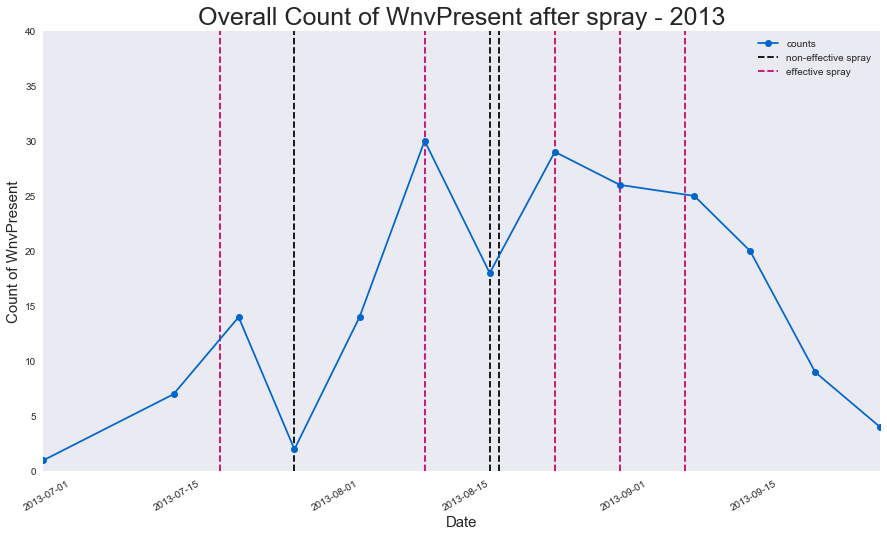

In [28]:
WnvPresent1['2013'].plot(figsize=(15,9), marker='o', color='#0066cc', ylim=(0,40));
plt.vlines(['2013-07-25', '2013-08-15', '2013-08-16'], ymin=0, ymax=40, linestyles='dashed', label='non-effective spray');
plt.vlines(['2013-07-17', '2013-08-08','2013-08-22', '2013-08-29', '2013-09-05'], ymin=0, ymax=40, linestyles='dashed', color='#cc0066', label='effective spray');
plt.title("Overall Count of WnvPresent after spray - 2013", size=25);
plt.xlabel("Date",fontsize=15)
plt.ylabel("Count of WnvPresent",fontsize=15)
plt.grid(b=False)
plt.legend();

Based on the above, the spray appears to be effective on 5 out of the 8 spray dates in 2013 as the overall count of WnvPresent reduced after the spray has been implemented.

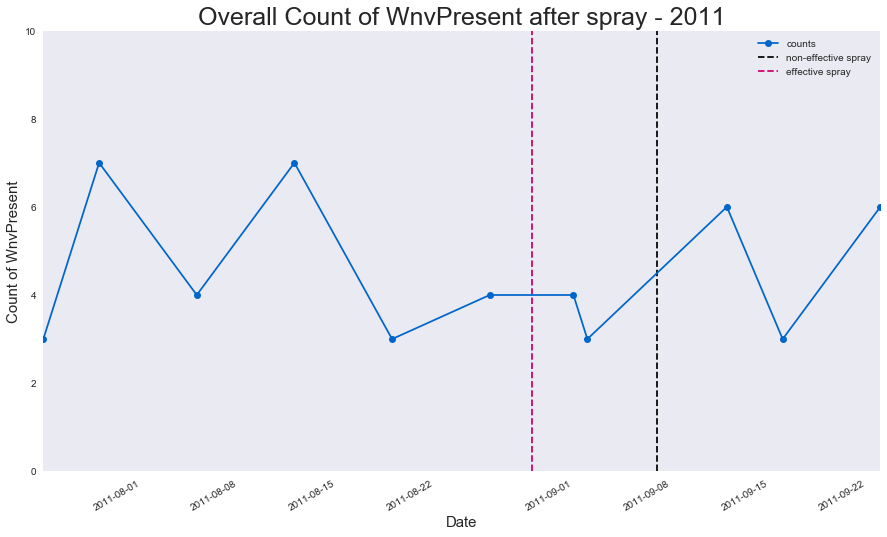

In [29]:
WnvPresent1['2011'].plot(figsize=(15,9), marker='o', color='#0066cc', ylim=(0,10));
plt.vlines(['2011-09-07'], ymin=0, ymax=10, linestyles='dashed', label='non-effective spray');
plt.vlines(['2011-08-29'], ymin=0, ymax=40, linestyles='dashed', color='#cc0066', label='effective spray');
plt.title("Overall Count of WnvPresent after spray - 2011", size=25);
plt.xlabel("Date",fontsize=15)
plt.ylabel("Count of WnvPresent",fontsize=15)
plt.grid(b=False)
plt.legend();

Based on the above, the spray appears to be effective on 1 out of the 2 spray dates in 2011 as the overall count of WnvPresent reduced after the spray has been implemented.

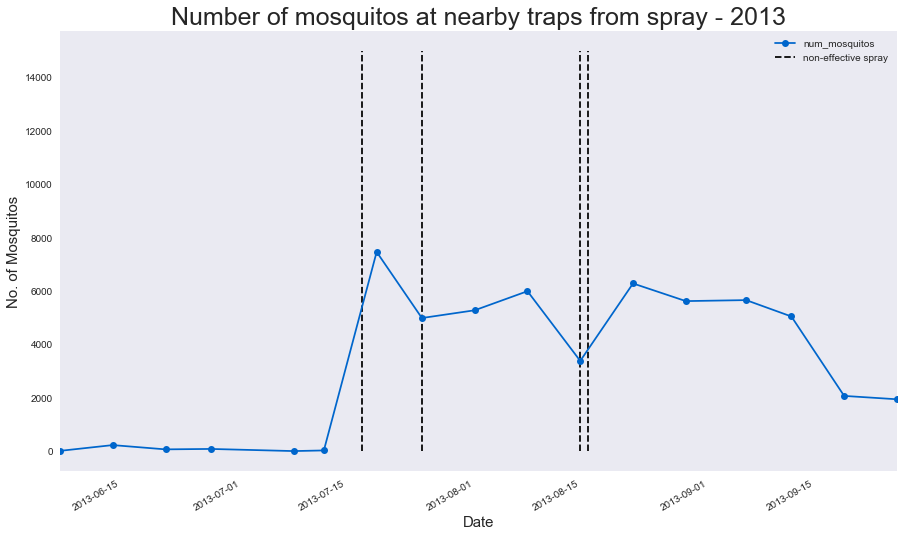

In [30]:
num_mos_nearby['2013'].plot(figsize=(15,9), marker='o', color='#0066cc');
plt.vlines(['2013-07-17', '2013-07-25', '2013-08-15', '2013-08-16'], ymin=0, ymax=15000, linestyles='dashed', label='non-effective spray');
plt.title("Number of mosquitos at nearby traps from spray - 2013", size=25);
plt.xlabel("Date",fontsize=15)
plt.ylabel("No. of Mosquitos",fontsize=15)
plt.grid(b=False)
plt.legend();

Based on the above, the 4 instances of the spray appears to be ineffective in 2013 as the number of mosquitos at nearby traps from spray did not decrease after the spray has been implemented.

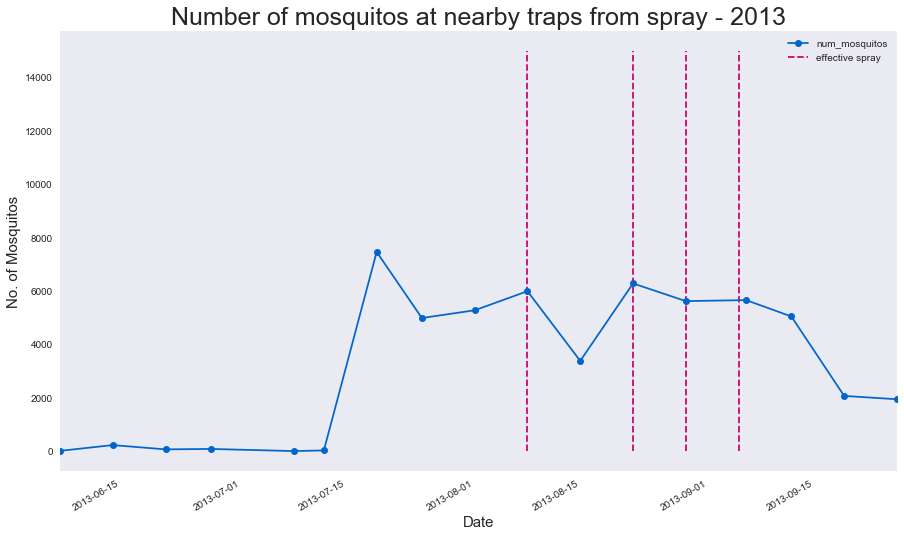

In [31]:
num_mos_nearby['2013'].plot(figsize=(15,9), marker='o', color='#0066cc');
plt.vlines(['2013-08-08','2013-08-22', '2013-08-29', '2013-09-05'], ymin=0, ymax=15000, linestyles='dashed', color='#cc0066', label='effective spray');
plt.title("Number of mosquitos at nearby traps from spray - 2013", size=25);
plt.xlabel("Date",fontsize=15)
plt.ylabel("No. of Mosquitos",fontsize=15)
plt.grid(b=False)
plt.legend();

Based on the above, the 4 instances of the spray appears to be effective in 2013 as the number of mosquitos at nearby traps from spray decreased after the spray has been implemented.

## Visualizations of the Effects of Spray Data

In [32]:
spray.Date = pd.to_datetime(spray.Date)
train.Date = pd.to_datetime(train.Date)
spray.set_index(spray['Date'],inplace=True)
train.set_index(train['Date'],inplace=True)
train.drop(columns='Date',inplace=True)
#organising into 2011 and 2013
spray['year'] = spray['Date'].dt.year
spray_2011 = spray[spray['year'] == 2011]
spray_2013 = spray[spray['year'] == 2013]
spray_2011['month']= spray_2011.index.strftime('%b')
spray_2013['month']= spray_2013.index.strftime('%b')
spray_2011['week']=spray_2011.index.strftime('%V')
spray_2013['week']=spray_2013.index.strftime('%V')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

In [33]:
def wnv_over_month(train,spray,year):
    mapdata = np.loadtxt("../data/mapdata_copyright_openstreetmap_contributors.txt")
    aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
    lon_lat_box = (-88, -87.5, 41.6, 42.1)
    for i in train.loc[train.year_y==year]['month'].unique():
        plt.figure(figsize=(10,14))
        plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=lon_lat_box, aspect=aspect)
        #plotting for all sprays
        spray_plot = spray.drop_duplicates()
        spray_plot = spray_plot.loc[spray_plot['month']==i]
        plt.scatter(spray_plot['Longitude'], spray_plot['Latitude'], marker='x', color='blue',alpha=.05, label='Spray Locations')
        #plotting for all the traps
        locations = train[['Longitude', 'Latitude']].drop_duplicates().values
        plt.scatter(locations[:,0], locations[:,1], marker='o', label='Trap Locations',color = 'yellow')
        #plotting for stations
        plt.scatter(x = (-87.933, -87.752), y = (41.995, 41.786), marker='v', color='green', label='Weather Station')
        #import colour map
        alpha_cm = plt.cm.Reds
        alpha_cm._init()
        alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
        aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
        #Traps where only WNV is present
        sigthings = train.loc[(train['WnvPresent'] == 1) & (train['year_y'] == 2013) & (train['month']==i)]
        sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
        X = sigthings[['Longitude', 'Latitude']].values
        kd = KernelDensity(bandwidth=0.01)
        kd.fit(X)
        #creating meshgrid to plot the density of virus presence near a trap
        xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
        gridpoints = np.array([xv.ravel(),yv.ravel()]).T
        zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
        plt.imshow(zv, origin='lower', cmap=alpha_cm, extent=lon_lat_box, aspect=aspect)
        plt.title('WNV Presence for {} {}'.format(i,year))
        plt.legend(frameon=1)
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.savefig('../image/WNVpresent{}{}.png'.format(i,year))

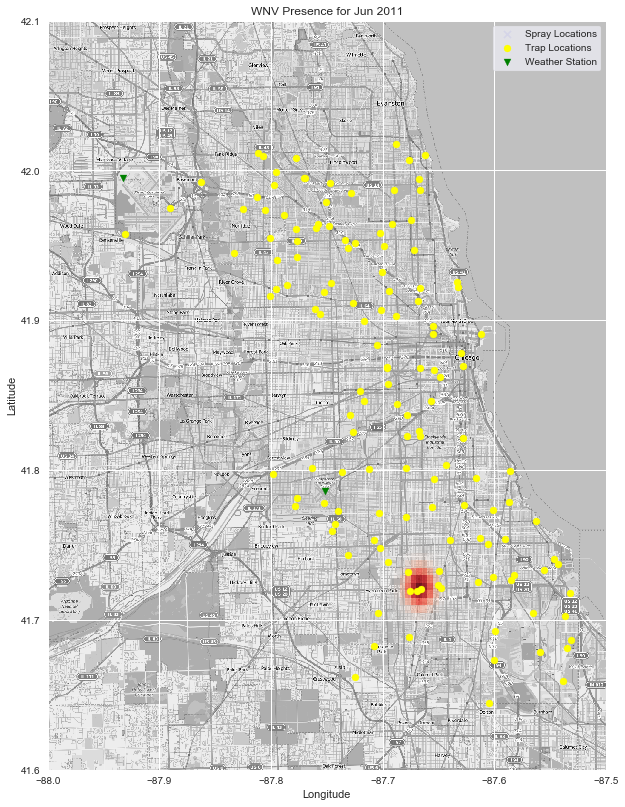

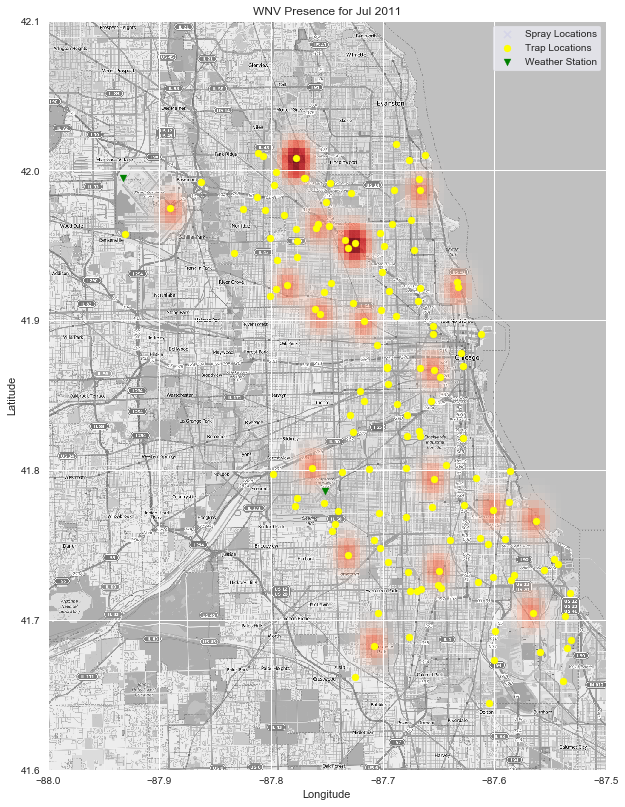

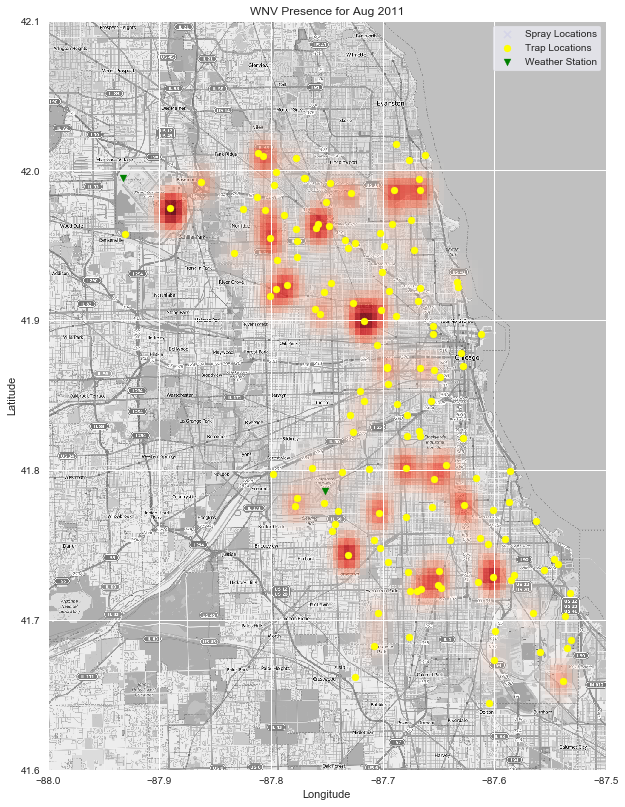

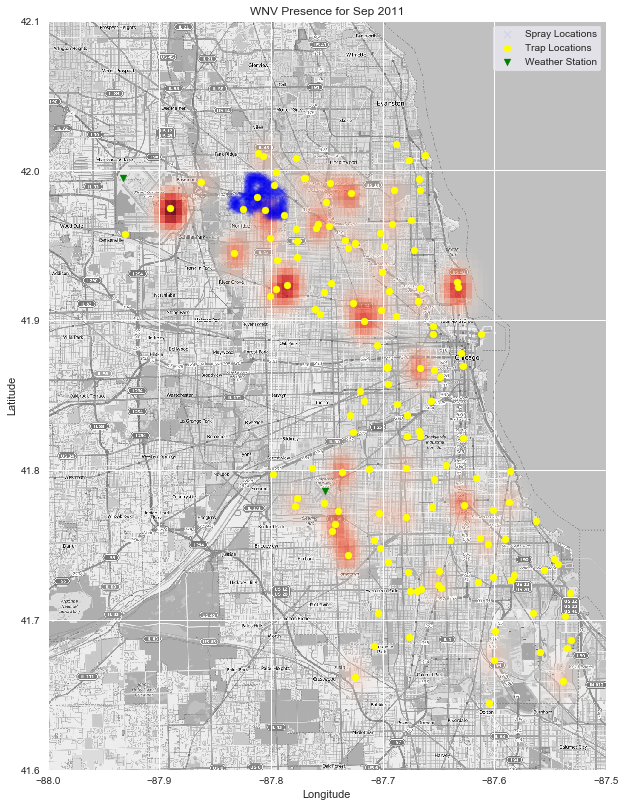

In [34]:
wnv_over_month(train,spray_2011,2011)

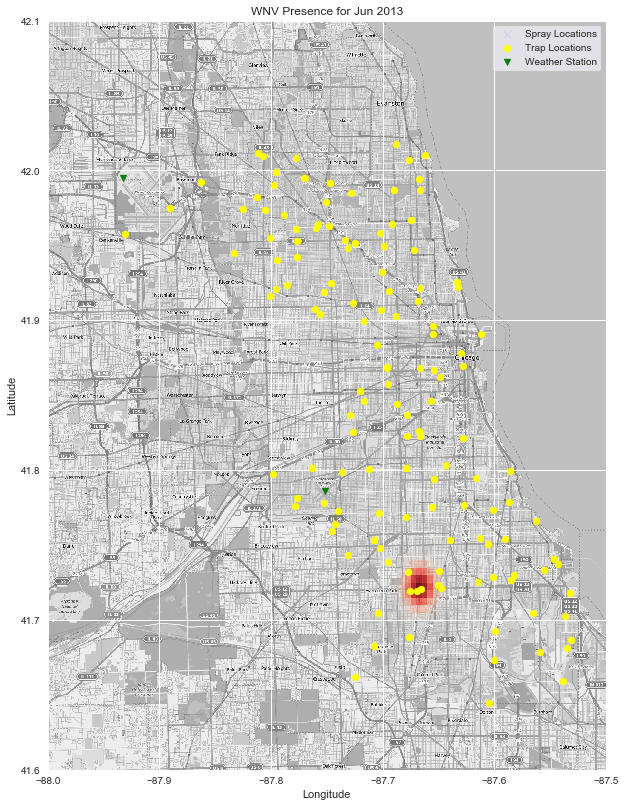

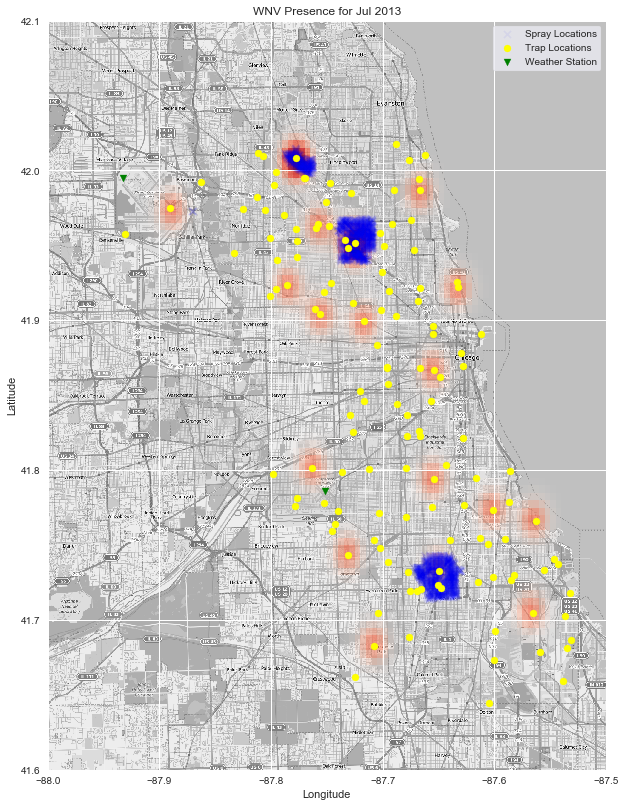

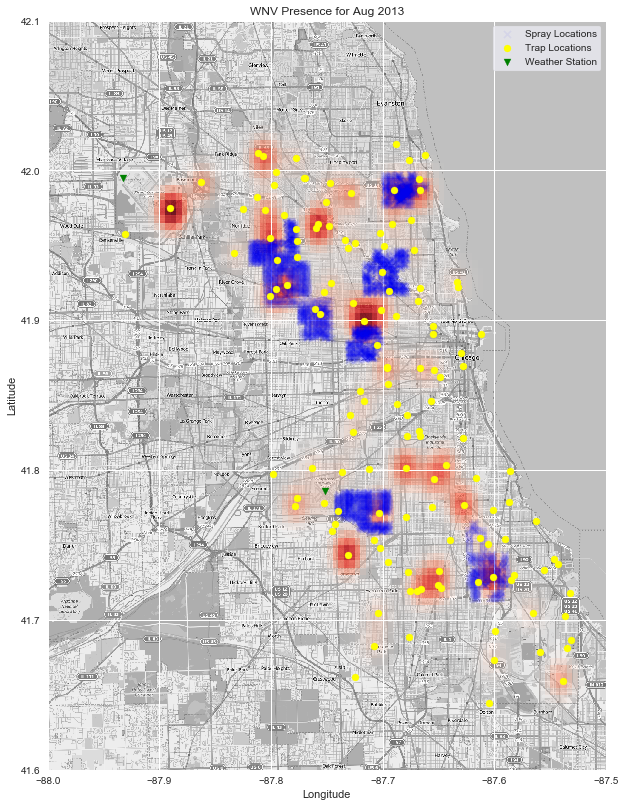

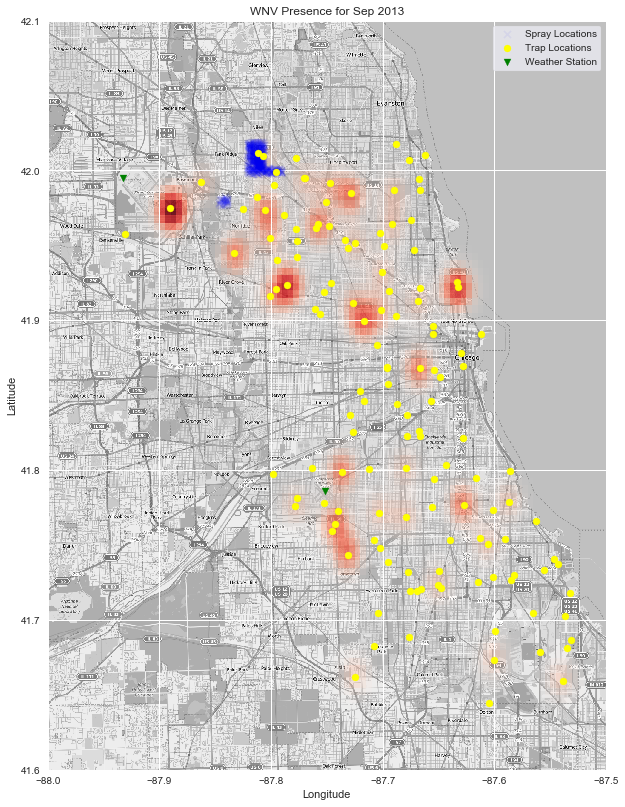

In [35]:
wnv_over_month(train,spray_2013,2013)

The effectiveness of the spray can be clearly seen when comparing the WnvPresence from Aug 2013 to Sep 2013 where the number of hotspots significantly decreased in the month following the implementation of the spray. In particular, 4 hotpots in Aug 2013 showed significant improvements the following month after the spray.

In [36]:
def nom_over_month(train,spray,year):
    mapdata = np.loadtxt("../data/mapdata_copyright_openstreetmap_contributors.txt")
    aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
    lon_lat_box = (-88, -87.5, 41.6, 42.1)
    for i in train.loc[train.year_y==year]['month'].unique():
        plt.figure(figsize=(10,14))
        plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=lon_lat_box, aspect=aspect)
        #plotting for all sprays
        spray_plot = spray.drop_duplicates()
        spray_plot = spray_plot.loc[spray_plot['month']==i]
        plt.scatter(spray_plot['Longitude'], spray_plot['Latitude'], marker='x', color='blue',alpha=.05, label='Spray Locations')
        #plotting for all the traps
        locations = train[['Longitude', 'Latitude']].drop_duplicates().values
        plt.scatter(locations[:,0], locations[:,1], marker='o', label='Trap Locations',color = 'yellow')
        #plotting for stations
        plt.scatter(x = (-87.933, -87.752), y = (41.995, 41.786), marker='v', color='green', label='Weather Station')
        #import colour map
        alpha_cm = plt.cm.Reds
        alpha_cm._init()
        alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
        aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
        #Traps where only WNV is present
        sigthings = train.loc[(train['year_y'] == 2013) & (train['month']==i)]
        sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['NumMosquitos'].reset_index()
        X = sigthings[['Longitude', 'Latitude']].values
        kd = KernelDensity(bandwidth=0.01)
        kd.fit(X)
        #creating meshgrid to plot the density of virus presence near a trap
        xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
        gridpoints = np.array([xv.ravel(),yv.ravel()]).T
        zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
        plt.imshow(zv, origin='lower', cmap=alpha_cm, extent=lon_lat_box, aspect=aspect)
        plt.title('Number of Moquitos for {} {}'.format(i,year))
        plt.legend(frameon=1)
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.savefig('../image/NoofMosquitos{}{}.png'.format(i,year))

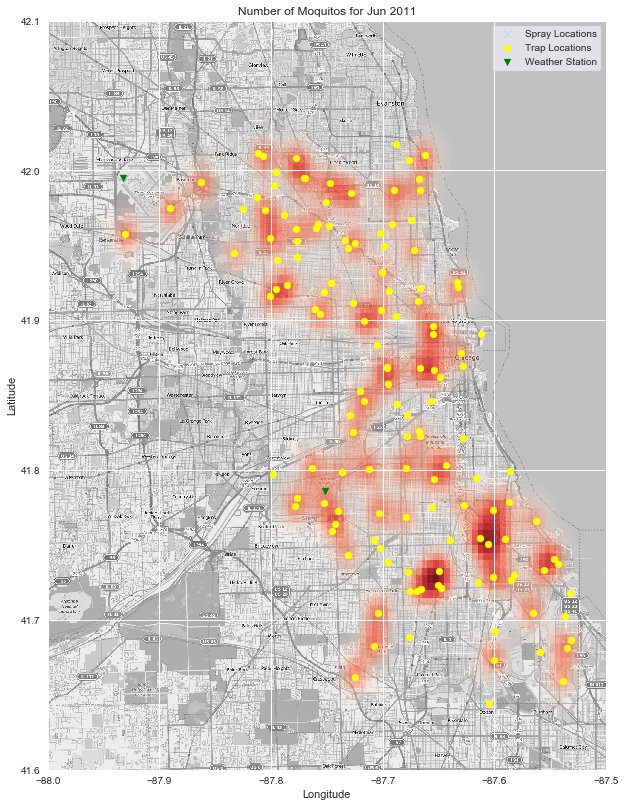

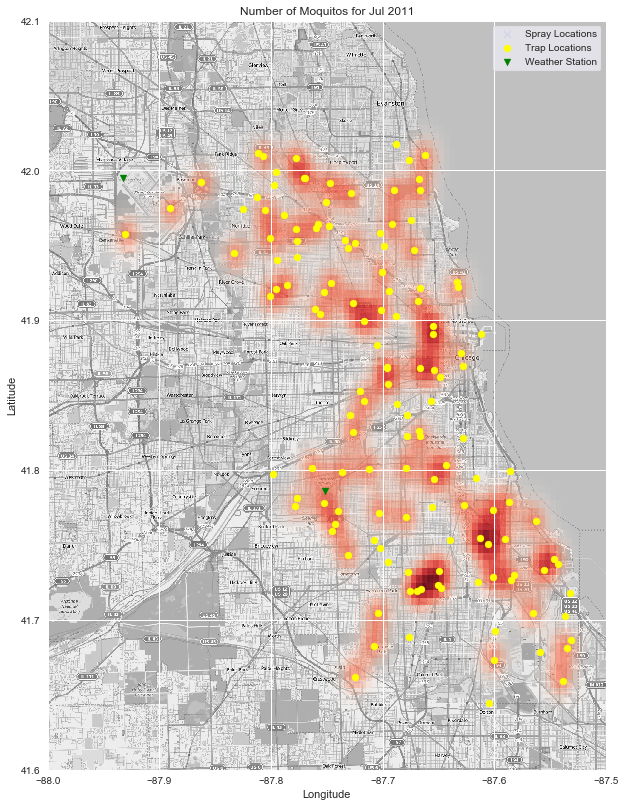

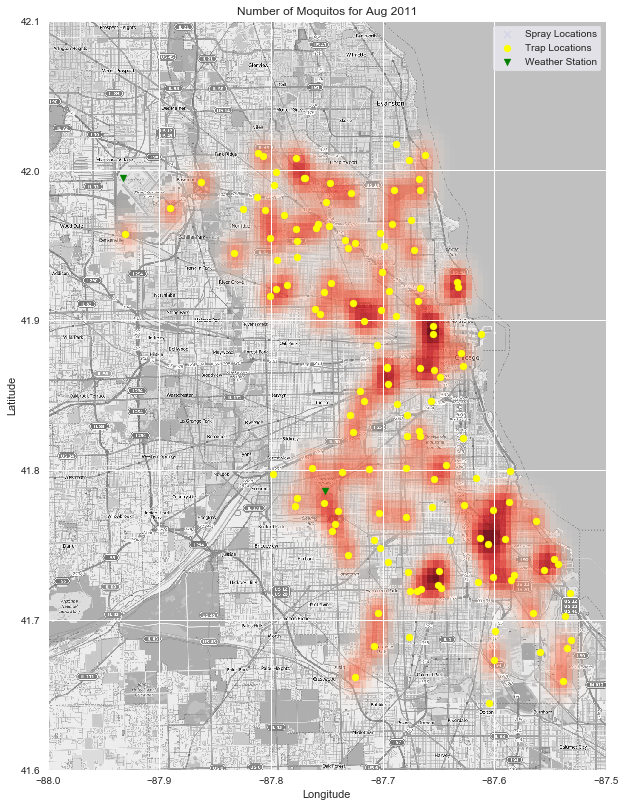

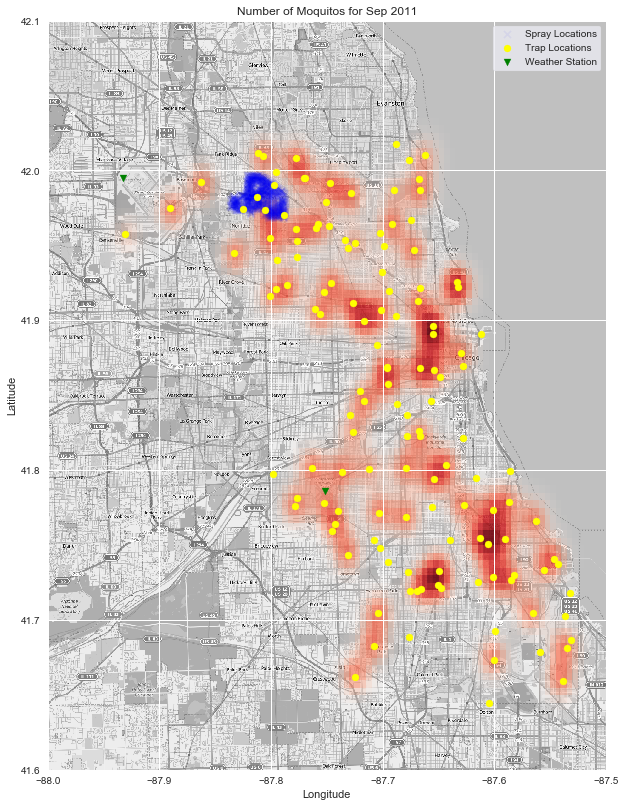

In [37]:
nom_over_month(train,spray_2011,2011)

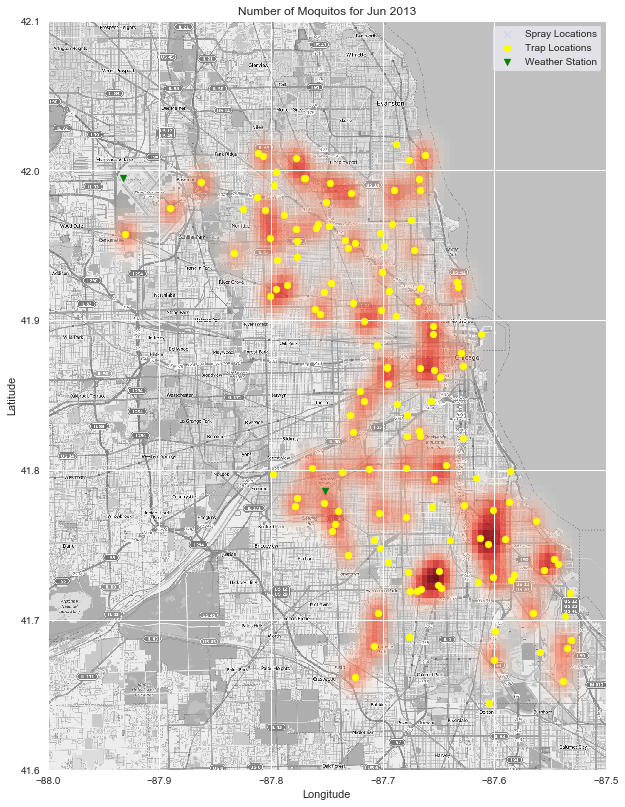

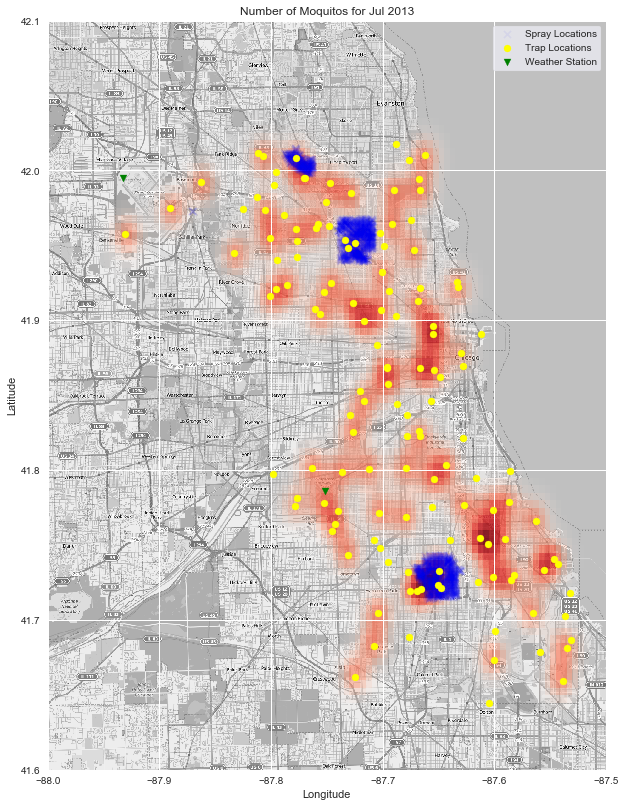

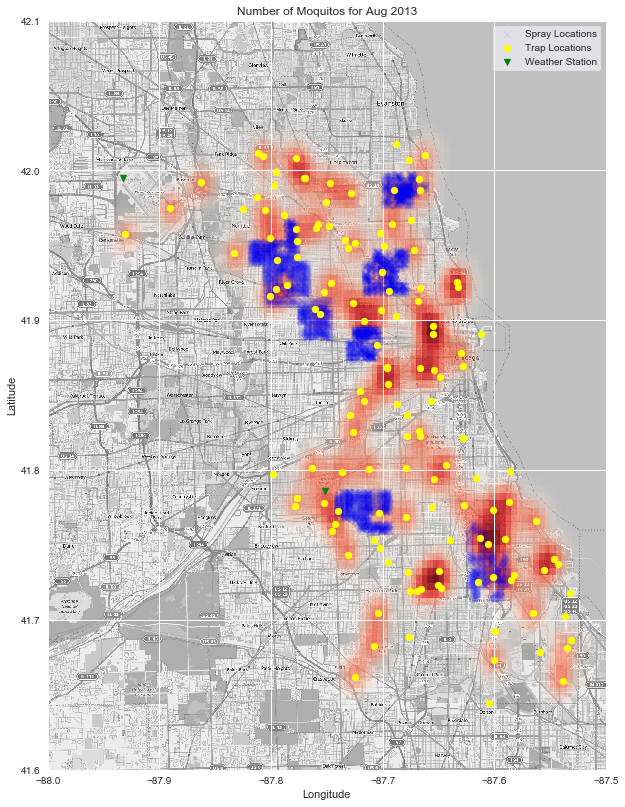

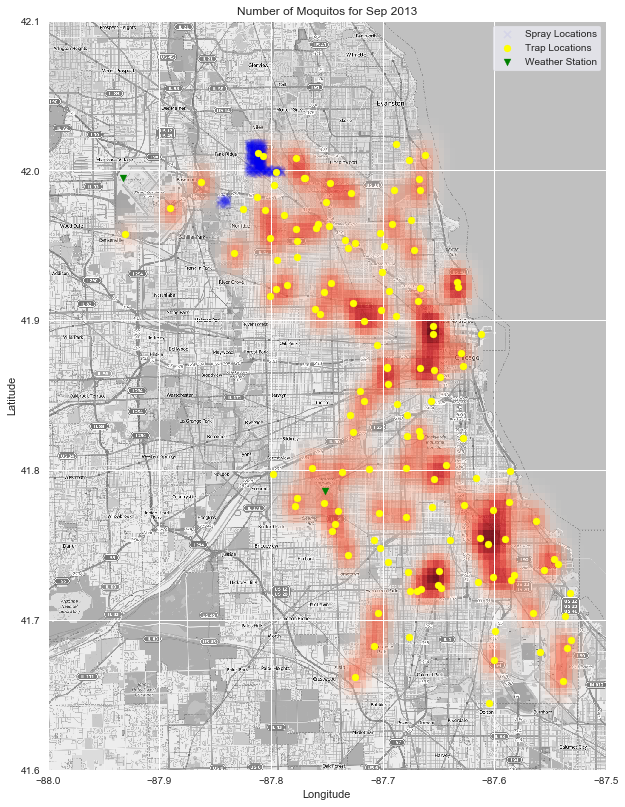

In [38]:
nom_over_month(train,spray_2013,2013)

The effectiveness of the spray can be clearly seen when comparing the No. of Mosquitos near traps from Aug 2013 to Sep 2013 where the number of hotspots significantly decreased in the month following the implementation of the spray. In particular, 4 hotpots in Aug 2013 showed significant improvements the following month after the spray.

## Conclusion

Refer to [Cost Benefit Analysis](file://../documents/Cost Benefit Analysis of Aerial Spraying.pdf)



- Cost to the city of Chicago is \$1 million a year due to WnV. 
- If spraying is conducted, assuming spray effectiveness of 50 percent, this would reduce WnV cases by half, leading to savings of \$0.5million.
- As spraying 100 percent of outbreaks is only projected to cost \$117,000, we recommend to conduct aerial spraying every 3 weeks, from Jun to Sep each year.
